KUL H02A5a Computer Vision: Group Assignment 2
---------------------------------------------------------------

<span style="color:red">**TODO**: Add your names below.</span>

<span style="color:red">**TODO**: Change the notebook name by replacing the X with your actual group number.</span>

Student names: <span style="color:red">name1, name2, ...</span>.

In this group assignment your team will delve into some deep learning applications for computer vision. The assignment will be delivered in the same groups from *Group assignment 1* and you start from this template notebook. You can make use of the *Group assignment 2* forum/discussion board on Toledo if you have any questions.

The notebook you submit for grading is the last notebook pinned as default and submitted to the competition prior to the deadline.

Good luck and have fun!

---------------------------------------------------------------
NOTES:
* This notebook is just a template. Please keep the five main sections, but feel free to adjust further in any way you please!
* Clearly indicate the improvements that you make! You can for instance use subsections like: *3.1. Improvement: applying loss function f instead of g*.


# Overview
This assignment consists of *three main parts* for which we expect you to provide code and extensive documentation in the notebook, with a final discussion:
* Image classification (Sect. 1)
* Semantic segmentation (Sect. 2)
* Adversarial attacks (Sect. 3)
* Discussion (Sect. 4)

## Deep learning resources
If you did not yet explore this in *Group assignment 1 (Sect. 2)*, we recommend using the Pytorch or TensorFlow (and/or Keras) library for building deep learning models.

In [3]:
# !pip install numpy
# !pip install pandas
# !pip install torch
# !pip install torchvision
# !pip install matplotlib
!pip install --force-reinstall torch torchvision --index-url https://download.pytorch.org/whl/cu128

Looking in indexes: https://download.pytorch.org/whl/cu128
  Using cached https://download-r2.pytorch.org/whl/cu128/torch-2.11.0%2Bcu128-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (29 kB)
  Using cached https://download-r2.pytorch.org/whl/cu128/torchvision-0.26.0%2Bcu128-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (5.5 kB)
  Using cached filelock-3.25.2-py3-none-any.whl.metadata (2.0 kB)
  Using cached https://download.pytorch.org/whl/typing_extensions-4.15.0-py3-none-any.whl.metadata (3.3 kB)
  Using cached https://download.pytorch.org/whl/setuptools-70.2.0-py3-none-any.whl.metadata (5.8 kB)
  Using cached sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
  Using cached networkx-3.6.1-py3-none-any.whl.metadata (6.8 kB)
  Using cached https://download.pytorch.org/whl/jinja2-3.1.6-py3-none-any.whl.metadata (2.9 kB)
  Using cached fsspec-2026.2.0-py3-none-any.whl.metadata (10 kB)
  Using cached https://download.pytorch.org/whl/cu128/cuda_bindings-12.9.4-cp312-cp312-manylinux_2_24_x86

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from matplotlib import pyplot as plt


## PASCAL VOC 2009
For this project you will be using the [PASCAL VOC 2009](http://host.robots.ox.ac.uk/pascal/VOC/voc2009/index.html) dataset. This dataset consists of colour images of various scenes with different object classes (e.g. animal: *bird, cat, ...*; vehicle: *aeroplane, bicycle, ...*), totalling 20 classes.

The training set contains 749 examples.


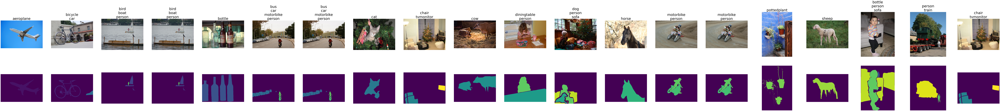

,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,"[[[10, 8, 13], [16, 14, 19], [17, 14, 21], [19...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


In [2]:
# Loading the training data
train_df = pd.read_csv('./kul-computer-vision-ga-2-2026/train/train_set.csv', index_col="Id")
labels = train_df.columns
train_df["img"] = [np.load('./kul-computer-vision-ga-2-2026/train/img/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
train_df["seg"] = [np.load('./kul-computer-vision-ga-2-2026/train/seg/train_{}.npy'.format(idx)) for idx, _ in train_df.iterrows()]
print("The training set contains {} examples.".format(len(train_df)))

# Show some examples196
fig, axs = plt.subplots(2, 20, figsize=(10 * 20, 10 * 2))
for i, label in enumerate(labels):
    df = train_df.loc[train_df[label] == 1]
    axs[0, i].imshow(df.iloc[0]["img"], vmin=0, vmax=255)
    axs[0, i].set_title("\n".join(label for label in labels if df.iloc[0][label] == 1), fontsize=40)
    axs[0, i].axis("off")
    axs[1, i].imshow(df.iloc[0]["seg"], vmin=0, vmax=20)  # with the absolute color scale it will be clear that the arrays in the "seg" column are label maps (labels in [0, 20])
    axs[1, i].axis("off")
    
plt.show()

# The training dataframe contains for each image 20 columns with the ground truth classification labels and 20 column with the ground truth segmentation maps for each class
train_df.head(1)

In [3]:
# Loading the test data
test_df = pd.read_csv('./kul-computer-vision-ga-2-2026/test/test_set.csv', index_col="Id")
test_df["img"] = [np.load('./kul-computer-vision-ga-2-2026/test/img/test_{}.npy'.format(idx)) for idx, _ in test_df.iterrows()]
test_df["seg"] = [-1 * np.ones(img.shape[:2], dtype=np.int8) for img in test_df["img"]]
print("The test set contains {} examples.".format(len(test_df)))

# The test dataframe is similar to the training dataframe, but here the values are -1 --> your task is to fill in these as good as possible in Sect. 2 and Sect. 3; in Sect. 6 this dataframe is automatically transformed in the submission CSV!
test_df.head(1)

The test set contains 750 examples.


,aeroplane,bicycle,bird,boat,bottle,bus,car,cat,chair,cow,...,horse,motorbike,person,pottedplant,sheep,sofa,train,tvmonitor,img,seg
Id,,,,,,,,,,,,,,,,,,,,,
0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,"[[[139, 130, 115], [136, 127, 112], [112, 102,...","[[-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, ..."


In [4]:
heights = train_df["img"].apply(lambda x: x.shape[0])
widths  = train_df["img"].apply(lambda x: x.shape[1])

pos_counts = train_df[labels].sum(axis=0).values        # positives per class
neg_counts = len(train_df) - pos_counts                  # negatives per class
pos_weight = torch.tensor(neg_counts / pos_counts,
                          dtype=torch.float32)
print(f"Max height : {heights.max()}")
print(f"Max width  : {widths.max()}")
print(f"Min height : {heights.min()}")
print(f"Min width  : {widths.min()}")
print(f"Mean height: {heights.mean():.1f}")
print(f"Mean width : {widths.mean():.1f}")
print("\nPositive counts", pos_counts)
print("Negative counts", neg_counts)
print("Positive weights", pos_weight)

Max height : 500
Max width  : 500
Min height : 112
Min width  : 257
Mean height: 383.1
Mean width : 471.8

Positive counts [ 47  39  55  48  42  38  63  45  69  30  48  43  42  47 207  43  27  44
  40  51]
Negative counts [702 710 694 701 707 711 686 704 680 719 701 706 707 702 542 706 722 705
 709 698]
Positive weights tensor([14.9362, 18.2051, 12.6182, 14.6042, 16.8333, 18.7105, 10.8889, 15.6444,
         9.8551, 23.9667, 14.6042, 16.4186, 16.8333, 14.9362,  2.6184, 16.4186,
        26.7407, 16.0227, 17.7250, 13.6863])


## Your Kaggle submission
Your filled test dataframe (during Sect. 2 and Sect. 3) must be converted to a submission.csv with two rows per example (one for classification and one for segmentation) and with only a single prediction column (the multi-class/label predictions running length encoded). You don't need to edit this section. Just make sure to call this function at the right position in this notebook.

In [5]:
def _rle_encode(img):
    """
    Kaggle requires RLE encoded predictions for computation of the Dice score (https://www.kaggle.com/lifa08/run-length-encode-and-decode)

    Parameters
    ----------
    img: np.ndarray - binary img array
    
    Returns
    -------
    rle: String - running length encoded version of img
    """
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    rle = ' '.join(str(x) for x in runs)
    return rle

def generate_submission(df):
    """
    Make sure to call this function once after you completed Sect. 2 and Sect. 3! It transforms and writes your test dataframe into a submission.csv file.
    
    Parameters
    ----------
    df: pd.DataFrame - filled dataframe that needs to be converted
    
    Returns
    -------
    submission_df: pd.DataFrame - df in submission format.
    """
    df_dict = {"Id": [], "Predicted": []}
    for idx, _ in df.iterrows():
        df_dict["Id"].append(f"{idx}_classification")
        df_dict["Predicted"].append(_rle_encode(np.array(df.loc[idx, labels])))
        df_dict["Id"].append(f"{idx}_segmentation")
        df_dict["Predicted"].append(_rle_encode(np.array([df.loc[idx, "seg"] == j + 1 for j in range(len(labels))])))
    
    submission_df = pd.DataFrame(data=df_dict, dtype=str).set_index("Id")
    submission_df.to_csv("submission.csv")
    return submission_df

# 1. Image classification
The task here is a multi-classification problem, below are the potential challenges for this task.
1. Variable image sizes: A neural network needs a fixed input.
2. Independent label classification: More than 1 label can be present in the same image.
3. Potential class imbalance: Some classes maybe more frequent than others.
4. Small dataset: may overfit.

Popular choices of types of models would include 2 main components: CNN and ViT. The main difference between these two is the inductive bias of CNN due to limited ability to learn spatial relations, whereas ViT transforms the image into multiple tokens which when combined with positional embeddings can learn global spatial relations better.

Although ViT could be advantageous here as it could learn dependant spatial relationships, for example, "sky is always up" however, we decided to move with CNN first as the core problem at hand is to identify wether an object is present in the image or not which does not really require global long-range dependencies, hence using ViT may not result into significant performance increase. Saving in terms of computation requirement, train dataset size as well as models complexity.

In [6]:
class VOCDataset(Dataset):
    """
    PyTorch Dataset for the PASCAL VOC 2009 subset.
 
    Wraps the train_df / test_df DataFrames produced by the starter code.
    Each item is a (image_tensor, label_tensor) pair for training, or just
    an image_tensor for inference.
 
    Parameters
    ----------
    df        : pd.DataFrame - the train or test dataframe
    labels    : list[str]   - the 20 class label column names
    transform : callable    - torchvision transform applied to each image
    inference : bool        - if True, returns only the image (no labels)
    """
 
    def __init__(self, df, labels, transform=None, inference=False):
        self.df        = df
        self.labels    = labels
        self.transform = transform
        self.inference = inference
 
    def __len__(self):
        return len(self.df)
 
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = row["img"].astype(np.uint8)   # stored as H×W×3 uint8 numpy array
 
        if self.transform:
            img = self.transform(img)
 
        if self.inference:
            return img
 
        labels = torch.tensor(row[self.labels].values.astype(np.float32))
        return img, labels

In [7]:
# ── Main model class ─────────────────────────────────────────────────────────── 
class VocClassifier(nn.Module):
    """
    Custom CNN for multi-label image classification on PASCAL VOC 2009,
    trained from scratch.
 
    Architecture overview
    ---------------------
    Five stages progressively increase channel depth while halving spatial
    dimensions via MaxPool. Middle stages (2-4) use a ResidualBlock (two
    conv layers + skip connection) for richer feature refinement at the
    same spatial scale. Outer stages (1 and 5) use a single ConvBnRelu
    since early features are too raw and late features are already abstract
    enough not to benefit from doubling.
 
    After the final stage, Global Average Pooling collapses the spatial
    dimensions to a fixed-length vector regardless of input resolution,
    solving the variable image size problem without any FC bottleneck.
 
    Spatial progression (for a 224x224 input):
        Input  :   3 x 224 x 224
        Stage 1:  32 x 112 x 112   (1 conv  + MaxPool)
        Stage 2:  64 x  56 x  56   (2 convs + MaxPool, residual)
        Stage 3: 128 x  28 x  28   (2 convs + MaxPool, residual)
        Stage 4: 256 x  14 x  14   (2 convs + MaxPool, residual)
        Stage 5: 512 x   7 x   7   (1 conv  + MaxPool)
        GAP    : 512 x   1 x   1   -> flatten -> 512
        Head   : 512 -> 256 -> 20
 
    Parameters
    ----------
    num_classes : int   - number of output classes (default 20 for VOC)
    dropout     : float - dropout probability in the classification head
    """
 
    def __init__(self, num_classes=20, dropout=0.5):
        super().__init__()
 
        # Stage 1: single conv — simple edge/colour detectors
        self.stage1 = nn.Sequential(
            self._conv_bn_relu(3, 32, kernel_size=7),
            nn.MaxPool2d(kernel_size=2, stride=2)       # 224 -> 112
        )
 
        # Stage 2: residual block — low-level pattern refinement
        self.stage2 = nn.Sequential(
            self._residual_block(32, 64),
            nn.MaxPool2d(kernel_size=2, stride=2)       # 112 -> 56
        )
 
        # Stage 3: residual block — object-part features
        self.stage3 = nn.Sequential(
            self._residual_block(64, 128),
            nn.MaxPool2d(kernel_size=2, stride=2)       # 56 -> 28
        )
 
        # Stage 4: residual block — semantic / object-level features
        self.stage4 = nn.Sequential(
            self._residual_block(128, 256),
            nn.MaxPool2d(kernel_size=2, stride=2)       # 28 -> 14
        )
 
        # Stage 5: single conv — highly abstract representations
        self.stage5 = nn.Sequential(
            self._conv_bn_relu(256, 512),
            nn.MaxPool2d(kernel_size=2, stride=2)       # 14 -> 7
        )

        # self.stage6 = nn.Sequential(
        #     self._conv_bn_relu(512, 1024),
        #     nn.MaxPool2d(kernel_size=2, stride=2)       # 14 -> 7
        # )
 
        # Global Average Pooling: collapses (B, 512, h, w) -> (B, 512, 1, 1)
        # regardless of h and w, solving the variable input size problem
        self.gap = nn.AdaptiveAvgPool2d((1, 1))
 
        # Classification head
        # No Sigmoid here — BCEWithLogitsLoss expects raw logits and is
        # numerically more stable than Sigmoid + BCELoss separately
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
            nn.Linear(256, num_classes)
        )
 
        self._init_weights()
 
    # ── Private building blocks ────────────────────────────────────────────────
    def _conv_bn_relu(self, in_channels, out_channels, kernel_size=3):
        """
        Conv2d -> BatchNorm2d -> ReLU
 
        The atomic building block used throughout the network.
        Padding = kernel_size // 2 keeps spatial dimensions unchanged so
        only MaxPool controls downsampling. bias=False since BatchNorm
        already learns a bias term, making a conv bias redundant.
 
        Parameters
        ----------
        in_channels  : int
        out_channels : int
        kernel_size  : int (default 3)
        """
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels,
                      kernel_size=kernel_size,
                      padding=kernel_size // 2,
                      bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
 
    def _residual_block(self, in_channels, out_channels):
        """
        Two _conv_bn_relu layers with a residual (skip) connection.
 
        Used in stages 2-4 where we stack two conv layers at the same
        spatial resolution. The first conv learns broader patterns at this
        scale; the second refines them into more specific features — giving
        an effective receptive field of two stacked 3x3 = 5x5 without the
        parameter cost of a larger kernel.
 
        The skip connection adds the input back after the two convs,
        letting the block learn a residual on top of the identity. This
        stabilises gradients and makes optimisation easier even at moderate
        network depth.
 
        If in_channels != out_channels a 1x1 conv projects the skip
        connection to the correct channel dimension before addition.
 
        Parameters
        ----------
        in_channels  : int
        out_channels : int
        """
 
        # inner class captures self from outer VocClassifier via closure
        outer_self = self
 
        class _ResidualBlock(nn.Module):
 
            def __init__(inner_self):
                super().__init__()
                inner_self.conv1 = outer_self._conv_bn_relu(in_channels,  out_channels)
                inner_self.conv2 = outer_self._conv_bn_relu(out_channels, out_channels)
                inner_self.relu  = nn.ReLU(inplace=True)
 
                # projection shortcut — aligns channel dims for the addition
                if in_channels != out_channels:
                    inner_self.shortcut = nn.Sequential(
                        nn.Conv2d(in_channels, out_channels,
                                  kernel_size=1, bias=False),
                        nn.BatchNorm2d(out_channels)
                    )
                else:
                    inner_self.shortcut = nn.Identity()
 
            def forward(inner_self, x):
                residual = inner_self.shortcut(x)
                out      = inner_self.conv1(x)
                out      = inner_self.conv2(out)
                return inner_self.relu(out + residual)  # add residual then ReLU
 
        return _ResidualBlock()
 
    def _init_weights(self):
        """
        Kaiming (He) initialisation for conv layers, constant 1/0 for BN.
 
        Kaiming init is designed for ReLU activations and ensures variance
        is preserved through the network depth — important when training
        from scratch where random init can cause vanishing/exploding signals.
        """
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out",
                                        nonlinearity="relu")
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias,   0)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_normal_(m.weight)
                nn.init.constant_(m.bias, 0)
 
    # ── Forward pass ───────────────────────────────────────────────────────────
    def forward(self, x):
        x = self.stage1(x)
        x = self.stage2(x)
        x = self.stage3(x)
        x = self.stage4(x)
        x = self.stage5(x)
        x = self.gap(x)
        x = self.classifier(x)
        return x
 
    # ── Private training helpers ───────────────────────────────────────────────
    def _train_one_epoch(self, loader, criterion, optimizer, device):
        """
        One full pass over the training DataLoader.
 
        Parameters
        ----------
        loader    : DataLoader
        criterion : loss function (BCEWithLogitsLoss)
        optimizer : torch.optim
        device    : torch.device
 
        Returns
        -------
        avg_loss : float
        """
        self.train()
        total_loss = 0.0
 
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            loss = criterion(self(imgs), labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
 
        return total_loss / len(loader)
 
    def _evaluate(self, loader, criterion, device, threshold):
        """
        Evaluation pass over a validation DataLoader.
 
        Parameters
        ----------
        loader    : DataLoader
        criterion : loss function
        device    : torch.device
        threshold : float - sigmoid threshold for binary prediction
 
        Returns
        -------
        avg_loss : float
        avg_f1   : float - macro-averaged F1 over all classes
        """
        self.eval()
        total_loss = 0.0
        all_preds, all_labels = [], []
 
        with torch.no_grad():
            for imgs, labels in loader:
                imgs, labels = imgs.to(device), labels.to(device)
                logits = self(imgs)
                total_loss += criterion(logits, labels).item()
                preds = (torch.sigmoid(logits) > threshold).float()
                all_preds.append(preds.cpu())
                all_labels.append(labels.cpu())
 
        all_preds  = torch.cat(all_preds,  dim=0).numpy()
        all_labels = torch.cat(all_labels, dim=0).numpy()
 
        # per-class F1 then macro average across all 20 classes
        f1_scores = []
        for c in range(all_labels.shape[1]):
            tp    = ((all_preds[:, c] == 1) & (all_labels[:, c] == 1)).sum()
            fp    = ((all_preds[:, c] == 1) & (all_labels[:, c] == 0)).sum()
            fn    = ((all_preds[:, c] == 0) & (all_labels[:, c] == 1)).sum()
            denom = 2 * tp + fp + fn
            f1_scores.append((2 * tp / denom) if denom > 0 else 0.0)
 
        return total_loss / len(loader), float(np.mean(f1_scores))
 
    def _predict(self, loader, device, threshold):
        """
        Inference pass — returns binary predictions for the test set.
 
        Parameters
        ----------
        loader    : DataLoader (built with inference=True VOCDataset)
        device    : torch.device
        threshold : float
 
        Returns
        -------
        predictions : np.ndarray of shape (N, num_classes), dtype int
        """
        self.eval()
        all_preds = []
 
        with torch.no_grad():
            for imgs in loader:
                preds = (torch.sigmoid(self(imgs.to(device))) > threshold).int()
                all_preds.append(preds.cpu())
 
        return torch.cat(all_preds, dim=0).numpy()
 
    # ── Public API ─────────────────────────────────────────────────────────────
    def fit(self, train_df, test_df, labels,
            img_size_H=224, img_size_W=224, batch_size=32,
            num_epochs=30, lr=1e-3,
            val_split=0.15, threshold=0.5, pos_weight=None,
            use_augmentation=0):
        """
        Full training pipeline: builds datasets, trains the model and fills
        the test_df classification columns — mirroring the interface of
        RandomClassificationModel in the starter code.
 
        Parameters
        ----------
        train_df   : pd.DataFrame - training dataframe from starter code
        test_df    : pd.DataFrame - test dataframe from starter code
        labels     : list[str]   - the 20 VOC class names
        img_size   : int         - input resolution (default 224)
        batch_size : int         - samples per batch (default 32)
        num_epochs : int         - number of training epochs (default 30)
        lr         : float       - initial learning rate (default 1e-3)
        val_split  : float       - fraction of train_df used for validation
        threshold  : float       - sigmoid decision threshold (default 0.5)
 
        Returns
        -------
        history : dict with keys "train_loss", "val_loss", "val_f1"
        """
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        print(f"Using device: {device}")
        self.to(device)
 
        # Train / val split
        n_val  = int(len(train_df) * val_split)
        val_df = train_df.iloc[:n_val].reset_index(drop=True)
        tr_df  = train_df.iloc[n_val:].reset_index(drop=True)
        
        # Transform: resize to fixed size and normalise
        # ImageNet statistics are a reasonable default even from scratch
        # since natural image distributions are similar
        # normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
        #                                  std =[0.229, 0.224, 0.225])
        normalize = transforms.Normalize(mean=[0, 0, 0],
                                         std =[1, 1, 1])
        
        if(use_augmentation == 1):
            train_transform = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((img_size_H, img_size_W)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
                transforms.RandomRotation(degrees=15),
                transforms.RandomGrayscale(p=0.1),
                transforms.ToTensor(),
            ])
        else:
            train_transform = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((img_size_H, img_size_W)),
                transforms.ToTensor(),  # H×W×C uint8 [0,255] -> C×H×W float [0,1]
                normalize
            ])

        val_transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((img_size_H, img_size_W)),
            transforms.ToTensor(),  # H×W×C uint8 [0,255] -> C×H×W float [0,1]
            normalize
        ])
 
        # Datasets and loaders
        train_loader = DataLoader(
            VOCDataset(tr_df,   labels, transform=train_transform),
            batch_size=batch_size, shuffle=True,  num_workers=2, pin_memory=True
        )
        val_loader = DataLoader(
            VOCDataset(val_df,  labels, transform=val_transform),
            batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True
        )
        test_loader = DataLoader(
            VOCDataset(test_df, labels, transform=val_transform, inference=True),
            batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True
        )
 
        # BCEWithLogitsLoss: numerically stable Sigmoid + BCELoss in one op
        criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight.to(device) if pos_weight is not None else None)
        optimizer = optim.Adam(self.parameters(), lr=lr)
        # Halves lr when val_loss does not improve for 3 consecutive epochs
        scheduler = optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode="min", factor=0.5, patience=3
        )
 
        history = {"train_loss": [], "val_loss": [], "val_f1": []}
 
        for epoch in range(1, num_epochs + 1):
            train_loss       = self._train_one_epoch(train_loader, criterion,
                                                     optimizer, device)
            val_loss, val_f1 = self._evaluate(val_loader, criterion,
                                              device, threshold)
            scheduler.step(val_loss)
 
            history["train_loss"].append(train_loss)
            history["val_loss"].append(val_loss)
            history["val_f1"].append(val_f1)
 
            print(f"Epoch {epoch:>3}/{num_epochs} | "
                  f"train_loss: {train_loss:.4f} | "
                  f"val_loss: {val_loss:.4f} | "
                  f"val_F1: {val_f1:.4f}")
 
        # Fill test_df classification columns — matches starter code interface
        predictions = self._predict(test_loader, device, threshold)
        test_df.loc[:, labels] = predictions
 
        print("\nDone. test_df classification columns filled.")
        return history

In [8]:
# Instantiate the model
cls_model = VocClassifier(num_classes=len(labels), dropout=0.0)

In [9]:
# Train the model and fill test_df classification columns.
# fit() handles the train/val split, dataloaders, loss, optimiser and
# scheduler internally — test_df[labels] is filled at the end automatically.
cls_history = cls_model.fit(
    train_df   = train_df,
    test_df    = test_df,
    labels     = labels,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 0
)

Using device: cuda
Epoch   1/100 | train_loss: 1.3039 | val_loss: 1.3091 | val_F1: 0.1459
Epoch   2/100 | train_loss: 1.1611 | val_loss: 1.3336 | val_F1: 0.1529
Epoch   3/100 | train_loss: 1.1250 | val_loss: 1.4558 | val_F1: 0.1666
Epoch   4/100 | train_loss: 1.1053 | val_loss: 1.2145 | val_F1: 0.1908
Epoch   5/100 | train_loss: 1.0519 | val_loss: 1.2187 | val_F1: 0.2044
Epoch   6/100 | train_loss: 1.0455 | val_loss: 1.3913 | val_F1: 0.1609
Epoch   7/100 | train_loss: 1.0029 | val_loss: 1.3850 | val_F1: 0.1726
Epoch   8/100 | train_loss: 1.0329 | val_loss: 1.3386 | val_F1: 0.2012
Epoch   9/100 | train_loss: 0.9474 | val_loss: 1.1850 | val_F1: 0.2325
Epoch  10/100 | train_loss: 0.9040 | val_loss: 1.2003 | val_F1: 0.2325
Epoch  11/100 | train_loss: 0.9122 | val_loss: 1.2001 | val_F1: 0.2349
Epoch  12/100 | train_loss: 0.8684 | val_loss: 1.3121 | val_F1: 0.2120
Epoch  13/100 | train_loss: 0.8667 | val_loss: 1.2025 | val_F1: 0.2368
Epoch  14/100 | train_loss: 0.8175 | val_loss: 1.1530 | va

In [ ]:
# # after training, test different thresholds on the val set
# for threshold in [0.3, 0.4, 0.5, 0.6]:
#     val_loss, val_f1 = cls_model._evaluate(val_loader, criterion, device, threshold)
#     print(f"threshold={threshold:.1f} -> val_F1={val_f1:.4f}")

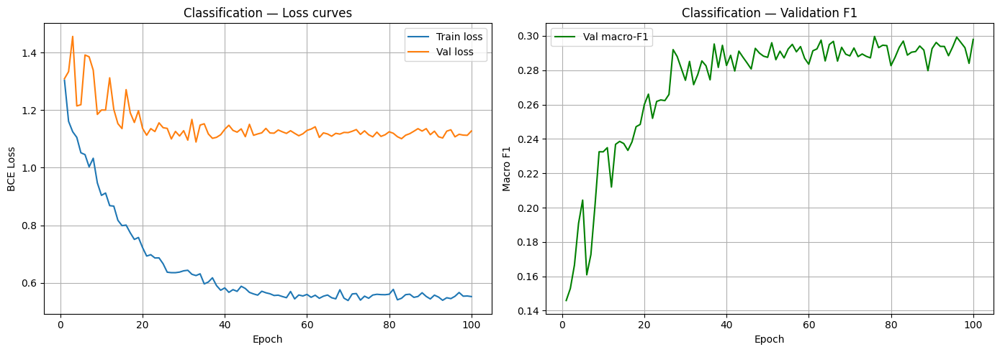

In [10]:
# -----------------------------------------------------------------------------
# 1.3 Learning curves
# Plot train/val loss and val F1 to check the model is learning correctly
# and to diagnose overfitting or underfitting.
# -----------------------------------------------------------------------------
 
epochs = range(1, len(cls_history["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

Above method is overfitting, before introducing regularisation technique, I would like to study the effect image augmentation.

In [11]:
# Instantiate the model
cls_model_aug = VocClassifier(num_classes=len(labels), dropout=0.0)

In [12]:
# Train the model and fill test_df classification columns.
# fit() handles the train/val split, dataloaders, loss, optimiser and
# scheduler internally — test_df[labels] is filled at the end automatically.
cls_history_aug = cls_model_aug.fit(
    train_df   = train_df,
    test_df    = test_df,
    labels     = labels,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device: cuda


Epoch   1/100 | train_loss: 1.3225 | val_loss: 1.4038 | val_F1: 0.1001
Epoch   2/100 | train_loss: 1.1985 | val_loss: 1.2642 | val_F1: 0.1740
Epoch   3/100 | train_loss: 1.1628 | val_loss: 1.3533 | val_F1: 0.1653
Epoch   4/100 | train_loss: 1.1718 | val_loss: 1.3642 | val_F1: 0.1590
Epoch   5/100 | train_loss: 1.1556 | val_loss: 1.1858 | val_F1: 0.1948
Epoch   6/100 | train_loss: 1.1452 | val_loss: 1.6215 | val_F1: 0.1361
Epoch   7/100 | train_loss: 1.1334 | val_loss: 1.5000 | val_F1: 0.1612
Epoch   8/100 | train_loss: 1.1191 | val_loss: 1.2811 | val_F1: 0.1735
Epoch   9/100 | train_loss: 1.0937 | val_loss: 1.3251 | val_F1: 0.1464
Epoch  10/100 | train_loss: 1.0506 | val_loss: 1.1902 | val_F1: 0.1896
Epoch  11/100 | train_loss: 1.0356 | val_loss: 1.1604 | val_F1: 0.2035
Epoch  12/100 | train_loss: 1.0101 | val_loss: 1.1211 | val_F1: 0.2135
Epoch  13/100 | train_loss: 1.0080 | val_loss: 1.2549 | val_F1: 0.2118
Epoch  14/100 | train_loss: 0.9966 | val_loss: 1.1745 | val_F1: 0.2150
Epoch 

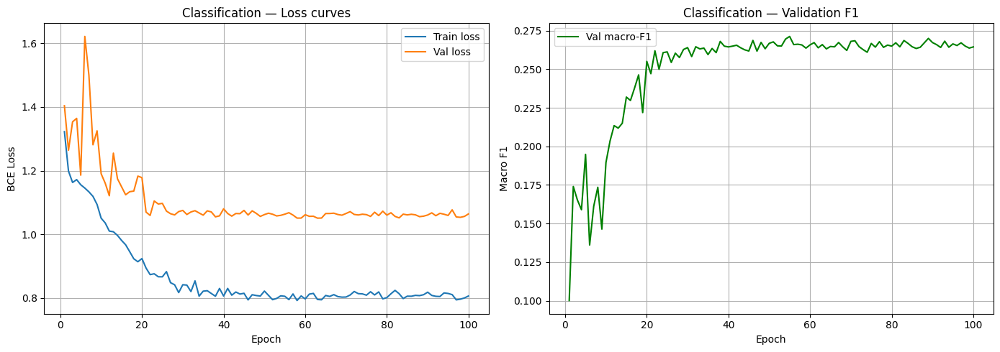

In [13]:
epochs = range(1, len(cls_history_aug["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_aug["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_aug["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_aug["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

In [14]:
# Instantiate the model
cls_model_aug_drop_out = VocClassifier(num_classes=len(labels), dropout=0.2)

In [15]:
cls_history_aug_drop_out = cls_model_aug_drop_out.fit(
    train_df   = train_df,
    test_df    = test_df,
    labels     = labels,
    img_size_H   = int(heights.mean()),      # resize all images to a size slightly higer than the mean size for consistent batching
    img_size_W   = int(widths.mean()),
    batch_size = 16,       # 32 fits comfortably in Kaggle GPU memory
    num_epochs = 100,       # start with 30; increase if val_loss still improving
    lr         = 1e-3,     # Adam default; scheduler will halve it on plateaus
    val_split  = 0.2,     # 15% of training data held out for validation
    threshold  = 0.5,       # sigmoid > 0.5 -> class predicted as present
    pos_weight = pos_weight,
    use_augmentation = 1
)

Using device: cuda


Epoch   1/100 | train_loss: 1.3529 | val_loss: 1.4406 | val_F1: 0.0847
Epoch   2/100 | train_loss: 1.2485 | val_loss: 1.2164 | val_F1: 0.1826
Epoch   3/100 | train_loss: 1.1976 | val_loss: 1.1731 | val_F1: 0.1844
Epoch   4/100 | train_loss: 1.2037 | val_loss: 1.2337 | val_F1: 0.1890
Epoch   5/100 | train_loss: 1.1763 | val_loss: 1.1503 | val_F1: 0.2073
Epoch   6/100 | train_loss: 1.1755 | val_loss: 1.1875 | val_F1: 0.1795
Epoch   7/100 | train_loss: 1.1639 | val_loss: 1.1892 | val_F1: 0.1982
Epoch   8/100 | train_loss: 1.1316 | val_loss: 1.1436 | val_F1: 0.2022
Epoch   9/100 | train_loss: 1.0859 | val_loss: 1.2055 | val_F1: 0.1835
Epoch  10/100 | train_loss: 1.0957 | val_loss: 1.0979 | val_F1: 0.2200
Epoch  11/100 | train_loss: 1.0958 | val_loss: 1.1436 | val_F1: 0.2166
Epoch  12/100 | train_loss: 1.0929 | val_loss: 1.0913 | val_F1: 0.2222
Epoch  13/100 | train_loss: 1.0759 | val_loss: 1.1225 | val_F1: 0.2081
Epoch  14/100 | train_loss: 1.0743 | val_loss: 1.1897 | val_F1: 0.1808
Epoch 

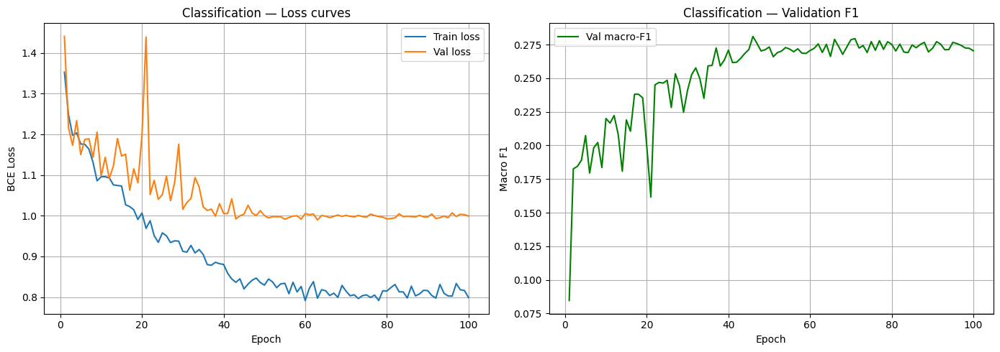

In [16]:
epochs = range(1, len(cls_history_aug_drop_out["train_loss"]) + 1)
 
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
 
# Loss curves
ax1.plot(epochs, cls_history_aug_drop_out["train_loss"], label="Train loss")
ax1.plot(epochs, cls_history_aug_drop_out["val_loss"],   label="Val loss")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("BCE Loss")
ax1.set_title("Classification — Loss curves")
ax1.legend()
ax1.grid(True)
 
# Validation F1
ax2.plot(epochs, cls_history_aug_drop_out["val_f1"], color="green", label="Val macro-F1")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.set_title("Classification — Validation F1")
ax2.legend()
ax2.grid(True)
 
plt.tight_layout()
plt.show()

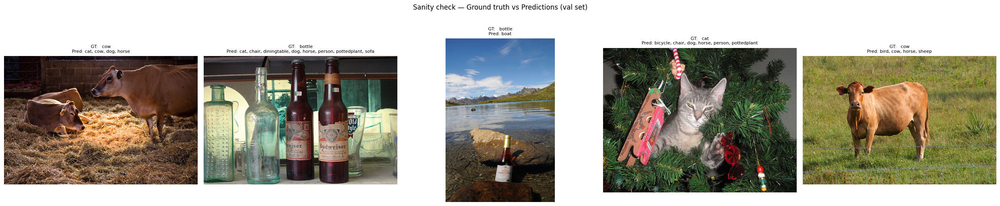

In [24]:
# -----------------------------------------------------------------------------
# 1.4 Quick sanity check on the validation set
# Show a few images with ground truth labels vs predicted labels so we can
# visually inspect what the model is getting right and wrong.
# -----------------------------------------------------------------------------

# # after training, test different thresholds on the val set
# for threshold in [0.3, 0.4, 0.5, 0.6]:
#     val_loss, val_f1 = cls_model._evaluate(val_loader, criterion, device, threshold)
#     print(f"threshold={threshold:.1f} -> val_F1={val_f1:.4f}")

# Rebuild val_df the same way fit() does internally so indices match
n_val  = int(len(train_df) * 0.15)
val_df = train_df.iloc[:n_val].reset_index(drop=True)
 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cls_model.eval()
 
# normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
#                                  std =[0.229, 0.224, 0.225])
normalize = transforms.Normalize(mean=[0,0,0],
                                 std =[1,1,1])
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((400, 400)),
    transforms.ToTensor(),
    normalize
])
 
n_show = 5
fig, axs = plt.subplots(1, n_show, figsize=(5 * n_show, 5))
 
for i in range(n_show):
    row      = val_df.iloc[i]
    img_np   = row["img"].astype("uint8")
    img_t    = transform(img_np).unsqueeze(0).to(device)  # add batch dim
 
    with torch.no_grad():
        probs = torch.sigmoid(cls_model(img_t)).squeeze().cpu().numpy()
 
    pred_labels = [labels[j] for j in range(len(labels)) if probs[j] > 0.5]
    true_labels = [labels[j] for j in range(len(labels)) if row[labels[j]] == 1]
 
    axs[i].imshow(img_np)
    axs[i].set_title(
        f"GT:   {', '.join(true_labels)}\n"
        f"Pred: {', '.join(pred_labels) if pred_labels else 'none'}",
        fontsize=8
    )
    axs[i].axis("off")
 
plt.suptitle("Sanity check — Ground truth vs Predictions (val set)", y=1.02)
plt.tight_layout()
plt.show()

# 2. Semantic segmentation
The goal here is to implement a segmentation model that labels every pixel in the image as belonging to one of the 20 classes (and/or background). Use the training set to train your model and compete on the test set (by filling in the segmentation column in the test dataframe).

In [ ]:
class RandomSegmentationModel:
    """
    Random segmentation model: 
        - generates random label maps for the inputs based on the class distributions observed during training
        - every pixel in an input can only have one label
    """
    def fit(self, X, Y):
        """
        Adjusts the class ratio variable to the one observed in Y. 

        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
        Y: list of arrays - n x (height x width)

        Returns
        -------
        self
        """
        self.distribution = np.mean([[np.sum(Y_ == i) / Y_.size for i in range(len(labels) + 1)] for Y_ in Y], axis=0)
        print("Setting class distribution to:\nbackground: {}\n{}".format(self.distribution[0], "\n".join(f"{label}: {p}" for label, p in zip(labels, self.distribution[1:]))))
        return self
        
    def predict(self, X):
        """
        Predicts for each input a label map.
        
        Parameters
        ----------
        X: list of arrays - n x (height x width x 3)
            
        Returns
        -------
        Y_pred: list of arrays - n x (height x width)
        """
        np.random.seed(0)
        return [np.random.choice(np.arange(len(labels) + 1), size=X_.shape[:2], p=self.distribution) for X_ in X]
    
    def __call__(self, X):
        return self.predict(X)
    
model = RandomSegmentationModel()
model.fit(train_df["img"], train_df["seg"])
test_df.loc[:, "seg"] = model.predict(test_df["img"])
test_df.head(1)

## Submit to competition
You don't need to edit this section. Just use it at the right position in the notebook. See the definition of this function in Sect. 1.3 for more details.

In [ ]:
generate_submission(test_df)

# 3. Adversarial attack
For this part, your goal is to fool your classification and/or segmentation model, using an *adversarial attack*. More specifically, the goal is build a network to perturb test images in a way that (i) they look unperturbed to humans; but (ii) the original model classifies/segments these images in line with the perturbations.

# 4. Discussion
Finally, take some time to reflect on what you have learned during this assignment. Why did you make certain design choices? How are the models learning and performing? Reflect and produce an overall discussion with links to the lectures and "real world" computer vision.